In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

datasets = pd.read_csv('pre_data/HousePriceDatasetsCleaned.csv')
datasets.head()

,list_time,area,area_name,price,price_string,rooms,property_legal_document,property_road_condition,property_back_condition,size,...,toilets,floors,house_type,furnishing_sell,longitude,latitude,street_id,width,projectid,price_m2
0,13 October 2021,81,Quận Long Biên,4690000000,"4,69 tỷ",8.0,1.0,0.0,1.0,67.0,...,7.0,4.467238,3.0,4.0,105.866340,21.05645,1282.0,4.000000,0.0,7.000000e+07
1,19 November 2021,81,Quận Long Biên,2250000000,"2,25 tỷ",3.0,1.0,0.0,1.0,30.0,...,4.0,4.467238,3.0,2.0,105.813811,21.01009,0.0,4.591385,0.0,7.500000e+07
2,20 November 2021,75,Quận Đống Đa,5800000000,"5,8 tỷ",5.0,1.0,0.0,0.0,62.0,...,3.0,3.161290,3.0,2.0,105.827430,21.02546,363.0,3.000000,0.0,9.354839e+07
3,05 November 2021,79,Quận Cầu Giấy,4300000000,"4,3 tỷ",3.0,1.0,1.0,0.0,62.0,...,2.0,3.000000,3.0,4.0,105.810310,21.06556,831.0,4.591385,0.0,6.935484e+07
4,13 November 2021,86,Quận Hà Đông,1740000000,"1,74 tỷ",3.0,1.0,0.0,1.0,32.0,...,2.0,3.125000,3.0,3.0,105.747430,20.97548,1937.0,4.000000,0.0,5.437500e+07


In [2]:
datasets.columns

Index(['list_time', 'area', 'area_name', 'price', 'price_string', 'rooms',
       'property_legal_document', 'property_road_condition',
       'property_back_condition', 'size', 'ward', 'ward_name', 'toilets',
       'floors', 'house_type', 'furnishing_sell', 'longitude', 'latitude',
       'street_id', 'width', 'projectid', 'price_m2'],
      dtype='object')

<AxesSubplot:xlabel='price', ylabel='Density'>

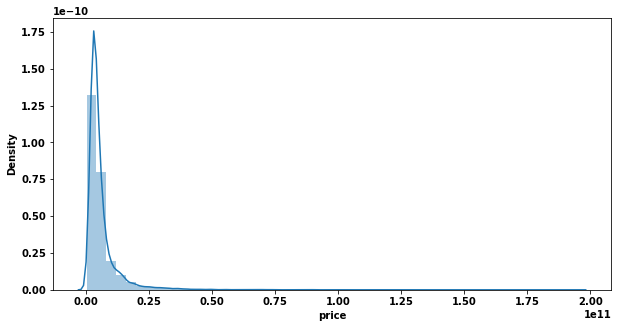

In [4]:
plt.figure(figsize = (10,5))
sns.distplot(datasets.price)

<AxesSubplot:xlabel='price_m2', ylabel='Density'>

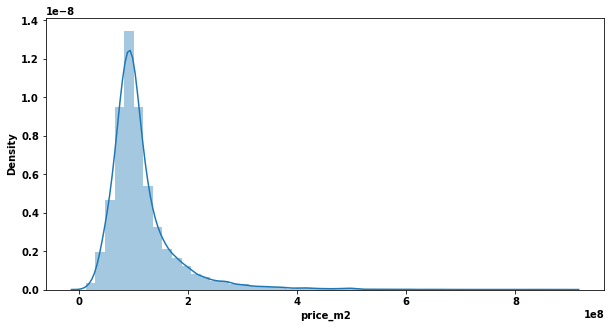

In [5]:
plt.figure(figsize = (10,5))
sns.distplot(datasets.price_m2)

<AxesSubplot:ylabel='price'>

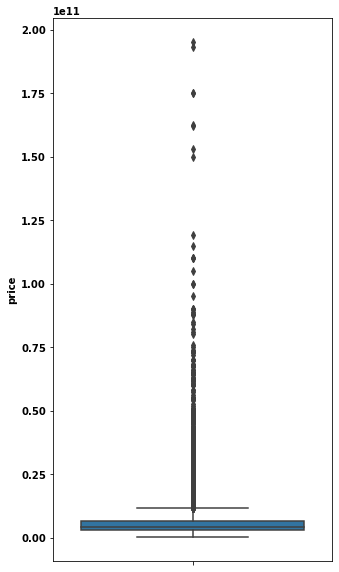

In [7]:
plt.figure(figsize = (5, 10))
sns.boxplot(y = datasets.price)

<AxesSubplot:ylabel='price_m2'>

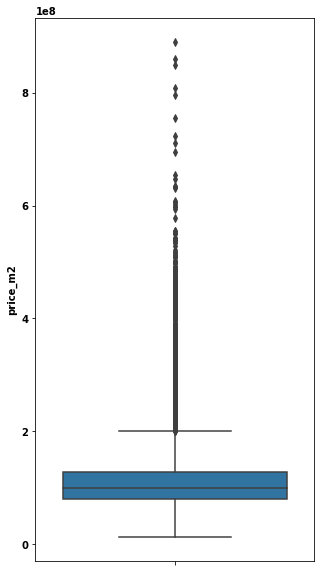

In [8]:
plt.figure(figsize = (5, 10))
sns.boxplot(y = datasets.price_m2)

#### **features_numerical**

In [3]:
features_numerical = datasets.loc[:, ['size', 'floors', 'rooms', 'width', 'toilets', 'longitude', 'latitude']]

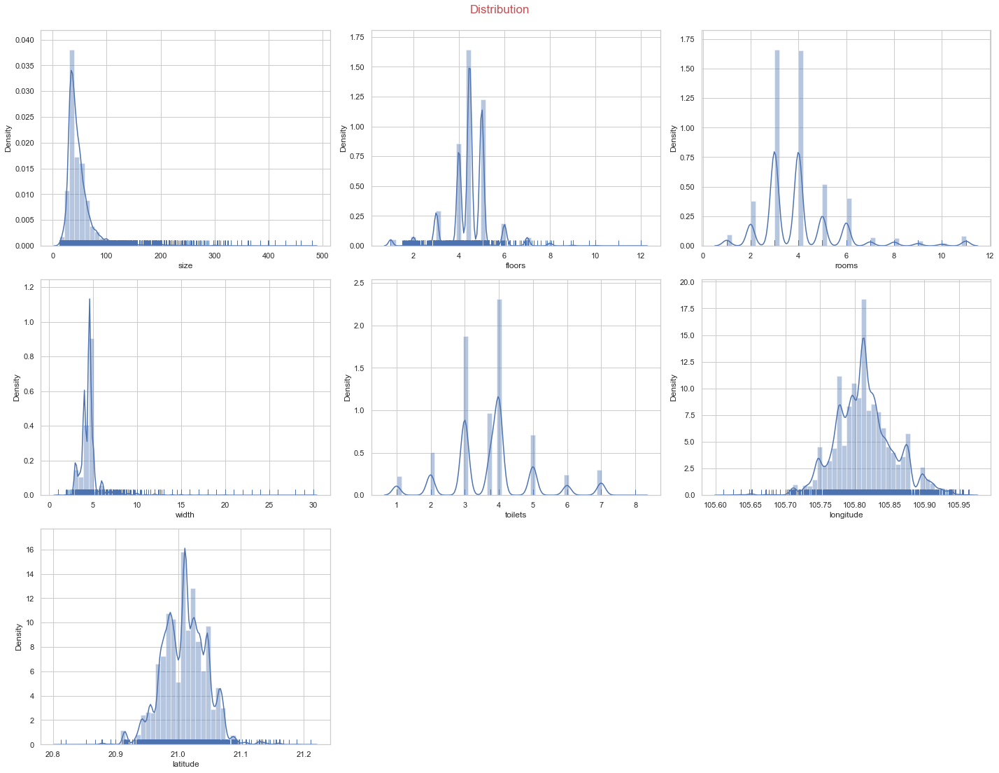

In [4]:
fig = plt.figure(figsize = (20,15))
sns.set(style = 'whitegrid')
for i in range(len(features_numerical.columns)):
    fig.add_subplot(3, 3, i+1)
    sns.distplot(features_numerical.iloc[:,i].dropna(), rug = True, kde_kws = {'bw':0.1}, color = 'b')
    plt.xlabel(features_numerical.columns[i])
plt.tight_layout()
fig.text(x=0.5, y=1.01, s='Distribution',
         fontsize=17, horizontalalignment='center', color='r')
plt.show()

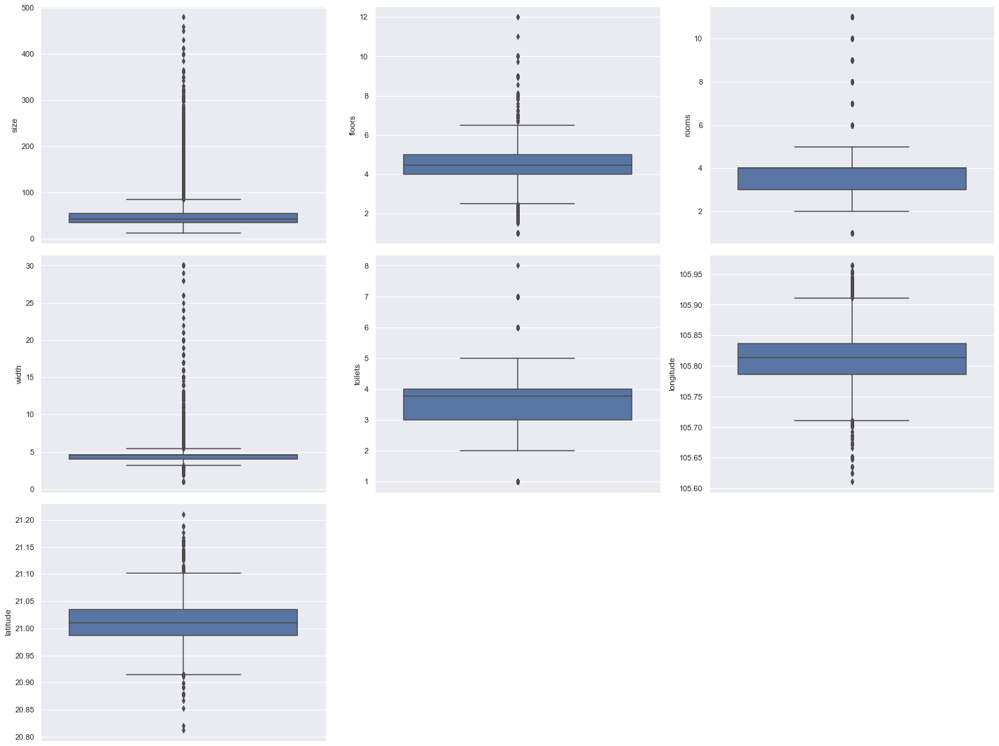

In [5]:
fig = plt.figure(figsize = (20,15))
sns.set(style = 'darkgrid')
for i in range(len(features_numerical.columns)):
    fig.add_subplot(3, 3, i+1)
    sns.boxplot(y = features_numerical.iloc[:,i].dropna())
plt.tight_layout()

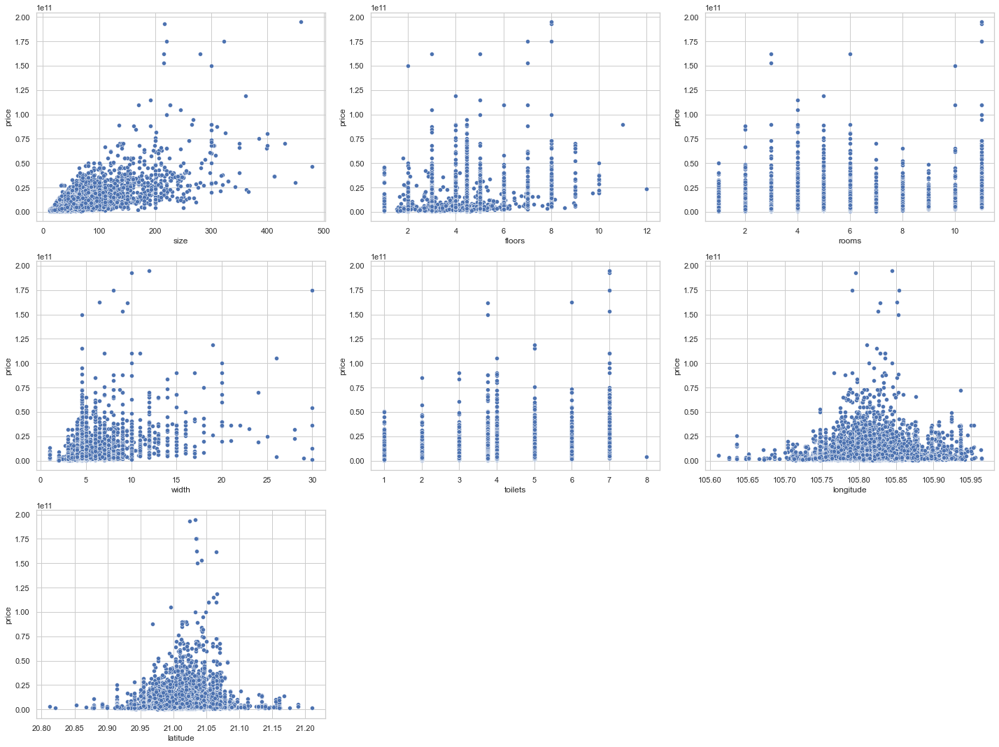

In [6]:
fig = plt.figure(figsize = (20,15))
sns.set(style = 'whitegrid')
for i in range(len(features_numerical.columns)):
    fig.add_subplot(3, 3, i+1)
    sns.scatterplot(features_numerical.iloc[:,i].dropna(), datasets.price)
plt.tight_layout()

<AxesSubplot:>

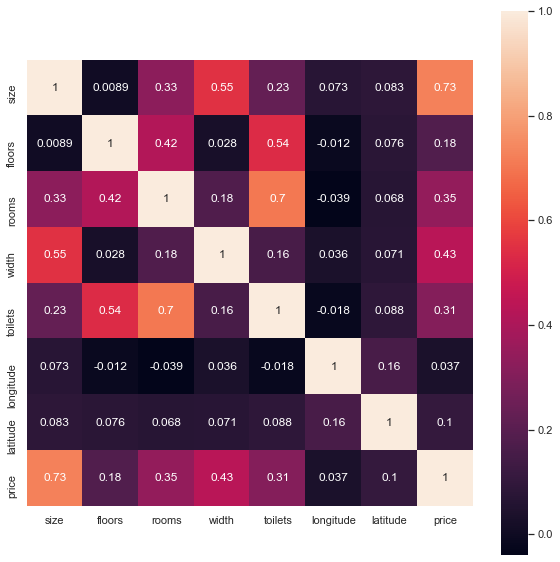

In [7]:
fig = plt.figure(figsize = (10,10))
sns.heatmap(datasets.loc[:, ['size', 'floors', 'rooms', 'width', 'toilets', 'longitude', 'latitude', 'price']].corr(), square = True, annot = True)

#### **features_categorical**

In [3]:
features_categorical = datasets.loc[:, ['area_name', 'property_legal_document', 'property_road_condition', 'projectid',
                                        'property_back_condition', 'ward_name', 'house_type', 'furnishing_sell']]

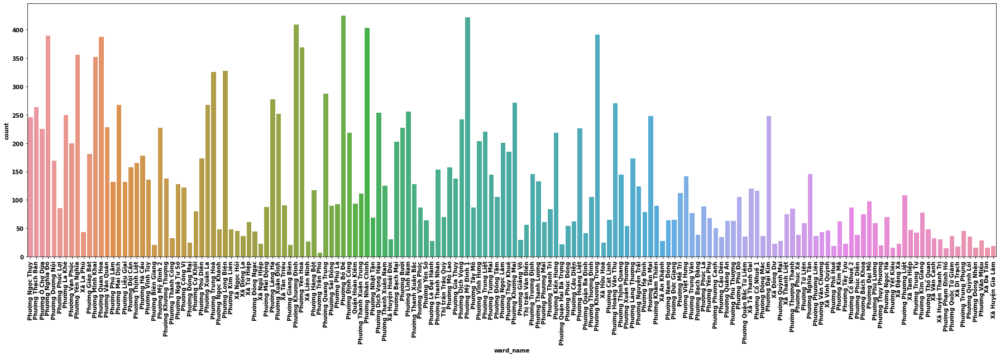

In [8]:
plt.figure(figsize = (25,9))
sns.countplot(features_categorical.iloc[:,5].dropna())
plt.xticks(rotation = 90)
plt.tight_layout()


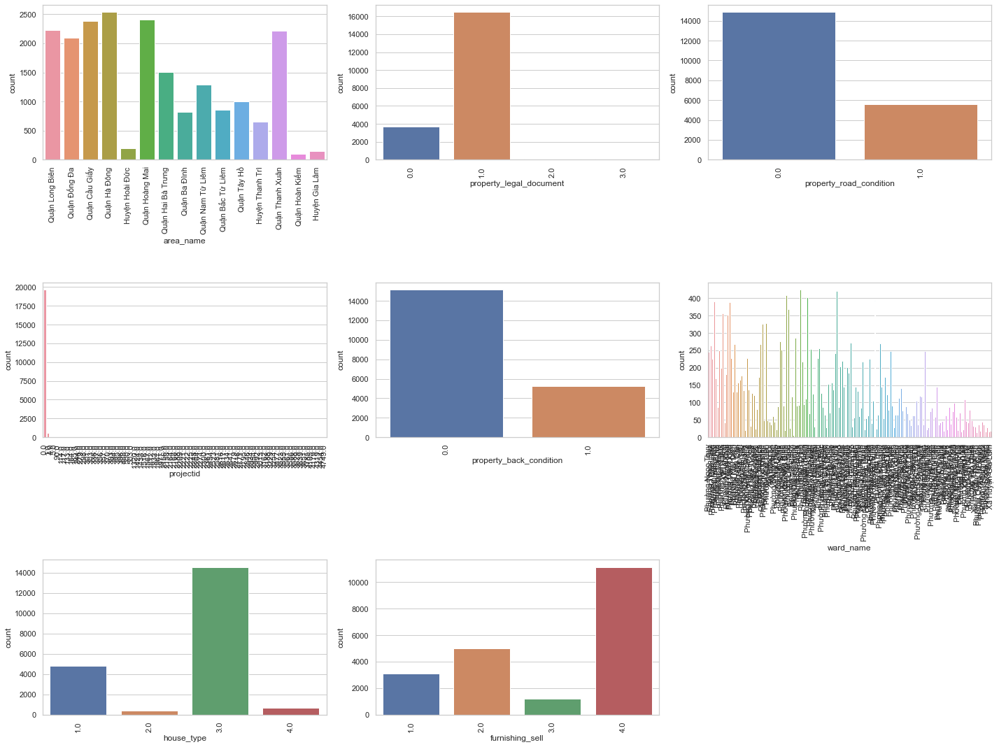

In [9]:
fig = plt.figure(figsize = (20,15))
for i in range(len(features_categorical.columns)):
    fig.add_subplot(3, 3, i+1)
    ax = sns.countplot(features_categorical.iloc[:,i].dropna())
    plt.xticks(rotation = 90)
plt.tight_layout()

In [10]:
fig = px.bar(data_frame=datasets['area_name'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 width=1200, height=500, xaxis={'categoryorder':'total descending'}, title='Numbers of house in area')

fig.update_xaxes(automargin=True)

In [11]:
fig = px.bar(data_frame=datasets['ward_name'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 width=1250, height=500, title='Numbers of house in area')

fig.update_xaxes(automargin=True)

In [87]:
cate_counnt = datasets[['area_name','ward_name']].value_counts()

import numpy as np

index=[]
for i in cate_counnt.index:
    index.append(np.array(i))
index=np.array(index)

cate_count_df = pd.DataFrame(columns=['area_name','ward_name', 'Values'])
cate_count_df['area_name']=index[:,0]
cate_count_df['ward_name']=index[:,1]
cate_count_df['Values']=cate_counnt.values

px.bar(data_frame=cate_count_df, x='area_name', y='Values', color='ward_name')

In [12]:
for area in datasets['area_name'].unique():    
    fig = px.bar(data_frame=datasets.query('area_name == @area')['ward_name'].value_counts(), text='value')
    fig.update_traces(texttemplate='%{text}', textposition='outside')
    fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                    width=1200, height=500, xaxis={'categoryorder':'total descending'}, title=area)

    fig.update_xaxes(automargin=True)
    fig.show()

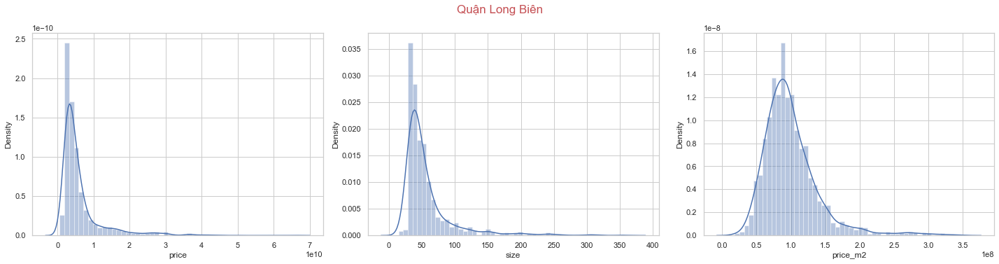

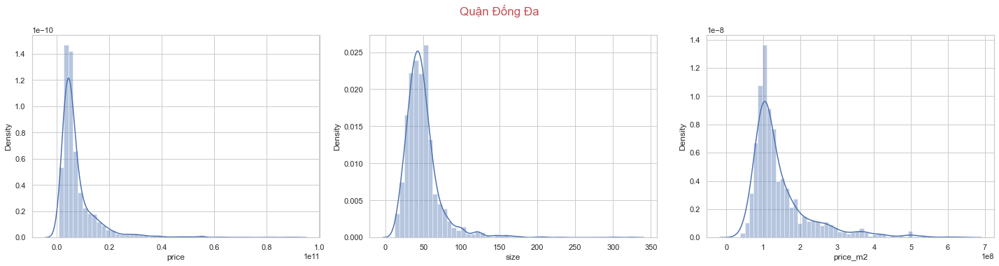

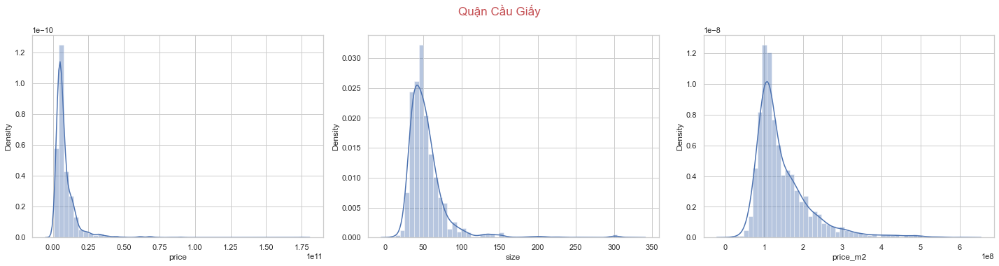

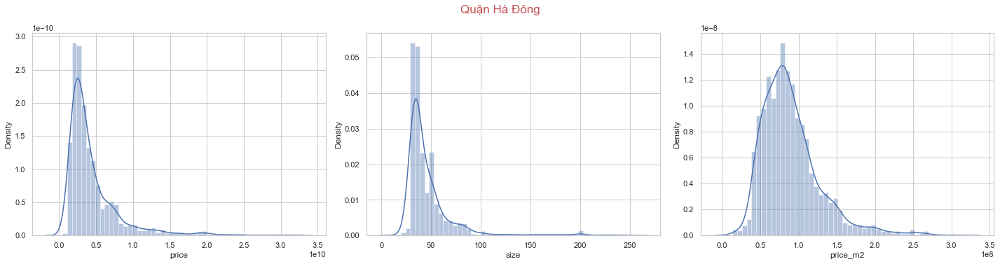

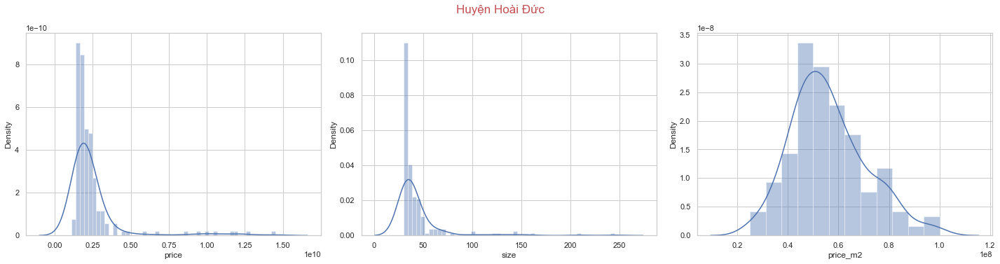

...

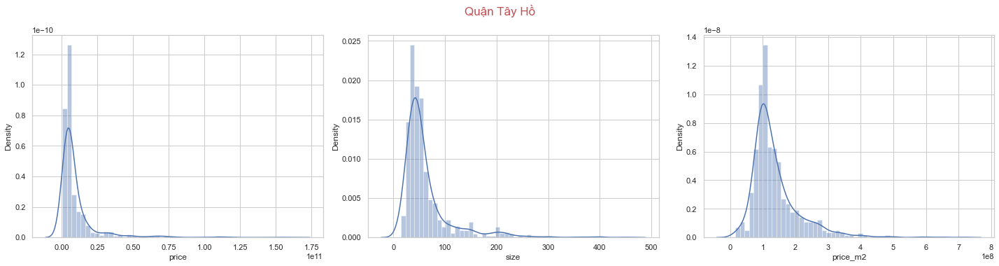

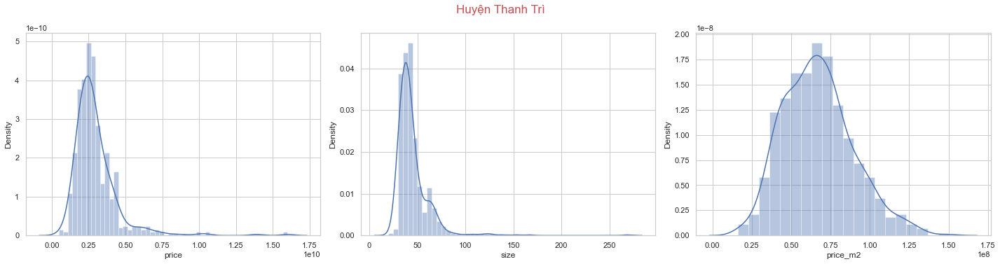

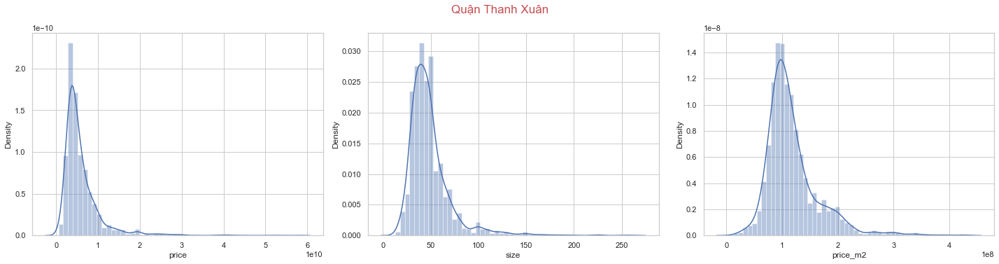

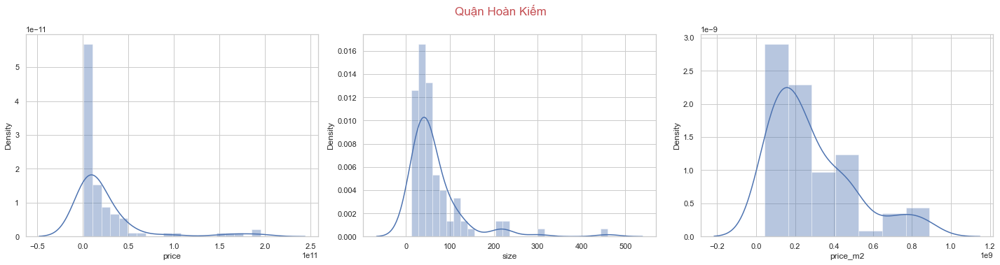

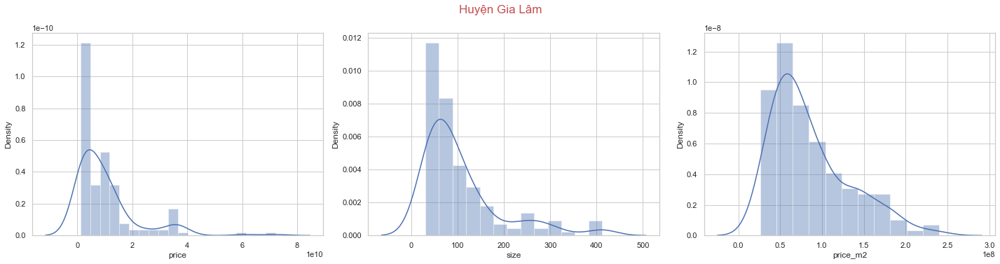

In [13]:
for area in datasets['area_name'].unique():
    fig = plt.figure(figsize = (20,5))
    fig.add_subplot(1, 3, 1)
    sns.distplot(datasets[datasets['area_name'] == area]['price'])

    fig.add_subplot(1, 3, 2)
    sns.distplot(datasets[datasets['area_name'] == area]['size'])

    fig.add_subplot(1, 3, 3)
    sns.distplot(datasets[datasets['area_name'] == area]['price_m2'])
    
    plt.tight_layout()
    fig.text(x=0.5, y=1.01, s=area, fontsize=17, horizontalalignment='center', color='r')
    
    plt.show()

#### **latitude - longitude**

In [14]:
px.scatter(datasets, y='latitude', x='longitude', color='area_name', height=600)

In [15]:
px.scatter(datasets, y='latitude', x='longitude', color='area_name', size='size', title='size', height=600)

In [16]:
px.scatter(datasets, y='latitude', x='longitude', color='area_name', size='price', title='price', height=600)

In [17]:
px.scatter(datasets, y='latitude', x='longitude', color='area_name', size='price_m2', title='price_m2', height=600)

#### **area**

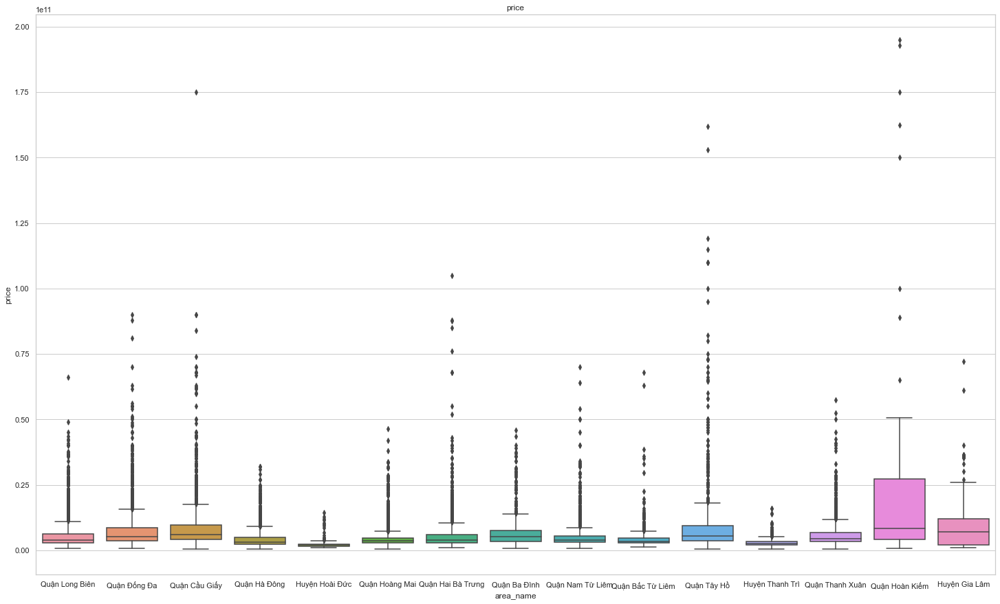

In [18]:
fig = plt.figure(figsize = (25,15))
sns.boxplot(x="area_name", y="price", data=datasets)
plt.title('price')
plt.show()

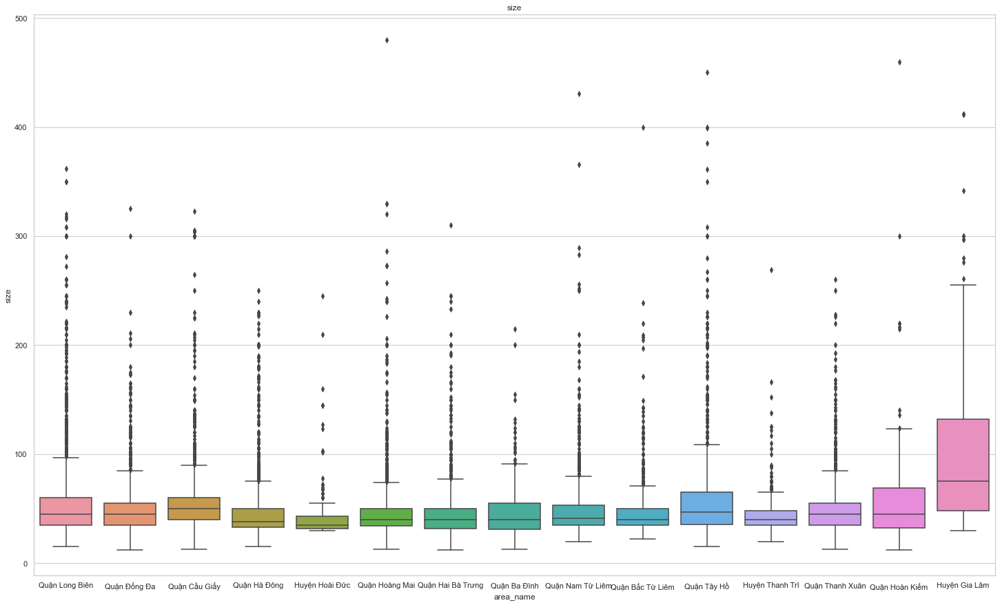

In [19]:
fig = plt.figure(figsize = (25,15))
sns.boxplot(x="area_name", y="size", data=datasets)
plt.title('size')
plt.show()

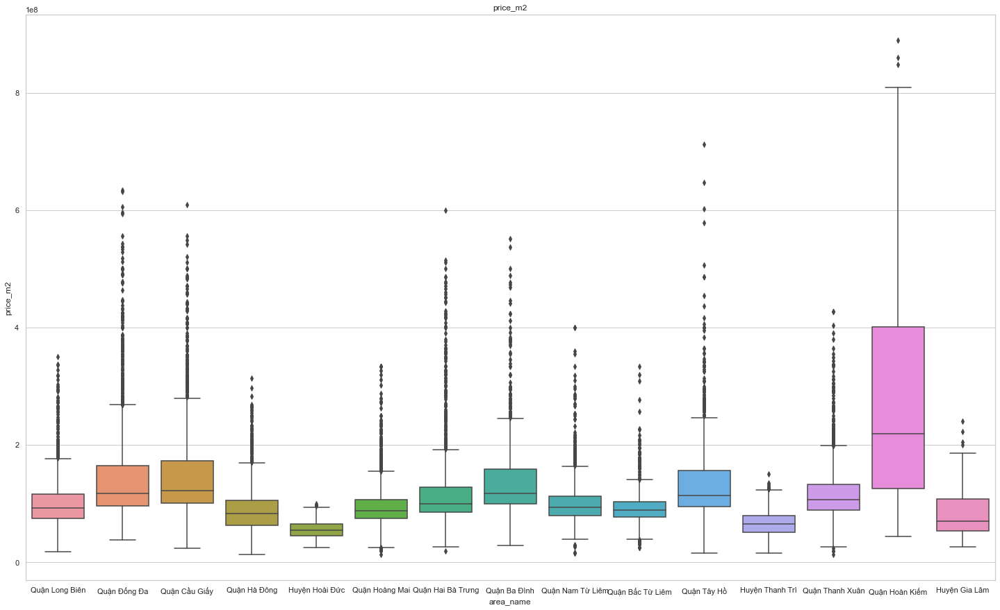

In [20]:
fig = plt.figure(figsize = (25,15))
sns.boxplot(x="area_name", y="price_m2", data=datasets)
plt.title('price_m2')
plt.show()

#### **ward**

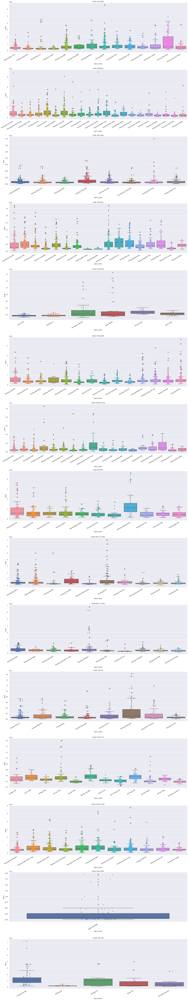

In [21]:
fig = plt.figure(figsize = (20, 350))
sns.set(style = 'darkgrid')
i=1
for area in datasets['area_name'].unique():
    fig.add_subplot(50, 1, i)
    sns.boxplot(x="ward_name", y="price", data=datasets.query('area_name == @area'))
    sns.stripplot(x="ward_name", y="price", data=datasets.query('area_name == @area'), jitter=True, edgecolor="gray")
    plt.title(area)
    plt.xticks(rotation=30, ha='right')
    i += 1
plt.tight_layout()
plt.show()

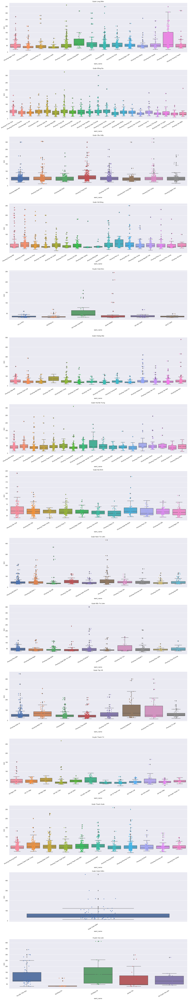

In [22]:
fig = plt.figure(figsize = (20, 350))
sns.set(style = 'darkgrid')
i=1
for area in datasets['area_name'].unique():
    fig.add_subplot(50, 1, i)
    sns.boxplot(x="ward_name", y="size", data=datasets.query('area_name == @area'))
    sns.stripplot(x="ward_name", y="size", data=datasets.query('area_name == @area'), jitter=True, edgecolor="gray")
    plt.title(area)
    plt.xticks(rotation=30, ha='right')
    i += 1
plt.tight_layout()
plt.show()

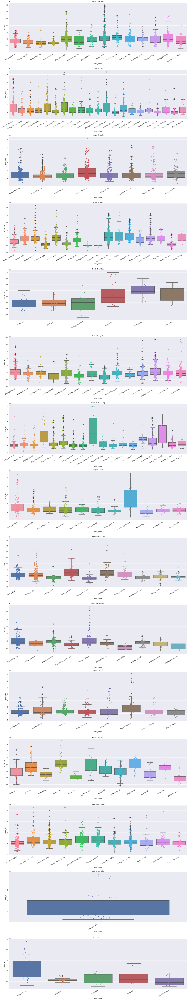

In [23]:
fig = plt.figure(figsize = (20, 350))
sns.set(style = 'darkgrid')
i=1
for area in datasets['area_name'].unique():
    fig.add_subplot(50, 1, i)
    sns.boxplot(x="ward_name", y="price_m2", data=datasets.query('area_name == @area'))
    sns.stripplot(x="ward_name", y="price_m2", data=datasets.query('area_name == @area'), jitter=True, edgecolor="gray")
    plt.title(area)
    plt.xticks(rotation=30, ha='right')
    i += 1
plt.tight_layout()
plt.show()

#### **List time**

In [24]:
datasets['list_time'] = pd.to_datetime(datasets['list_time'], format='%d %B %Y')

In [25]:
#10/9/2021 – 22/11/2021
datasets['list_time']

0       2021-10-13
1       2021-11-19
2       2021-11-20
3       2021-11-05
4       2021-11-13
           ...    
20422   2021-11-22
20423   2021-11-22
20424   2021-11-22
20425   2021-11-22
20426   2021-11-22
Name: list_time, Length: 20427, dtype: datetime64[ns]

In [26]:
fig = px.bar(data_frame=datasets['list_time'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 width=1200, height=500, xaxis={'categoryorder':'total descending'}, title='Time')

fig.update_xaxes(automargin=True)

In [27]:
df=datasets.copy()
df['month'] = pd.DatetimeIndex(df['list_time']).month

In [28]:
fig = px.bar(data_frame=df['month'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 width=1200, height=500, xaxis={'categoryorder':'total descending'}, title='Month')

fig.update_xaxes(automargin=True)

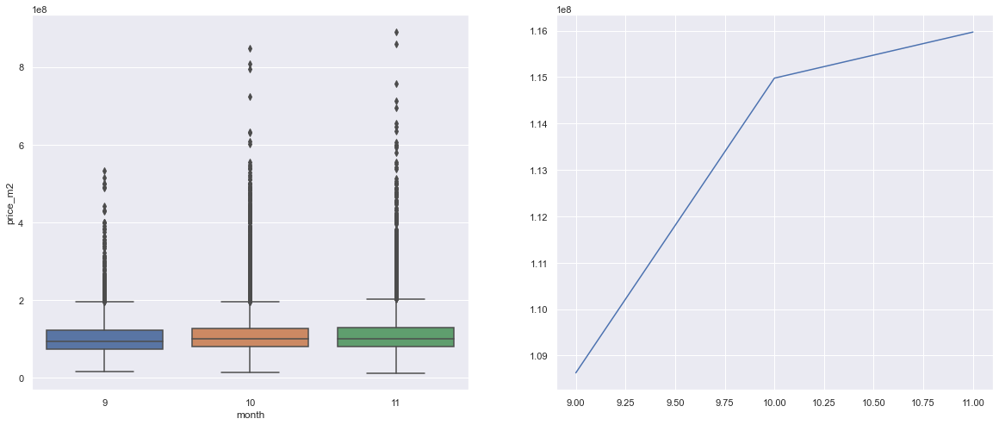

In [29]:
fig = plt.figure(figsize = (20, 8))
fig.add_subplot(1, 2, 1)
sns.boxplot(x="month", y="price_m2", data=df)

fig.add_subplot(1, 2, 2)
sns.lineplot(x=[9, 10, 11], y=[df.query('month == 9')['price_m2'].mean(), df.query('month == 10')['price_m2'].mean(), df.query('month == 11')['price_m2'].mean()])

plt.show()

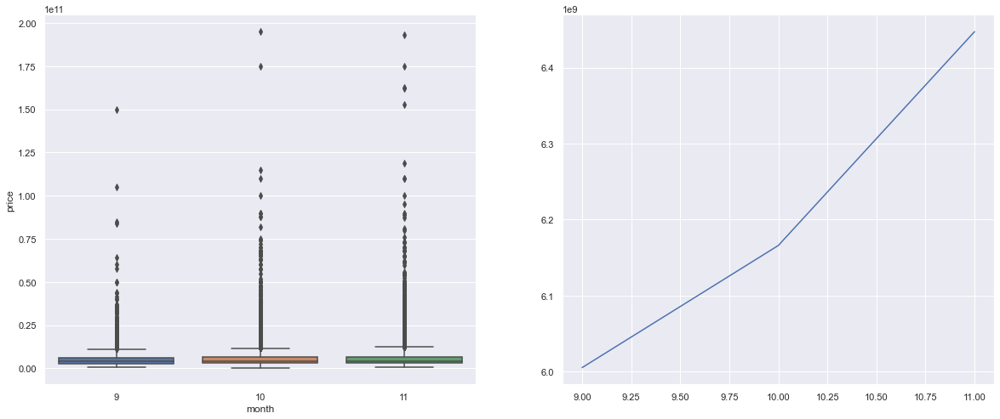

In [30]:
fig = plt.figure(figsize = (20, 8))
fig.add_subplot(1, 2, 1)
sns.boxplot(x="month", y="price", data=df)

fig.add_subplot(1, 2, 2)
sns.lineplot(x=[9, 10, 11], y=[df.query('month == 9')['price'].mean(), df.query('month == 10')['price'].mean(), df.query('month == 11')['price'].mean()])

plt.show()

In [31]:
fig = px.bar(data_frame=df.query('month == 9')['list_time'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 width=1200, height=500, xaxis={'categoryorder':'total descending'}, title='September')

fig.update_xaxes(automargin=True)

In [32]:
fig = px.bar(data_frame=df.query('month == 10')['list_time'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 width=1200, height=500, xaxis={'categoryorder':'total descending'}, title='October')

fig.update_xaxes(automargin=True)

In [33]:
fig = px.bar(data_frame=df.query('month == 11')['list_time'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 width=1200, height=500, xaxis={'categoryorder':'total descending'}, title='November')

fig.update_xaxes(automargin=True)

In [34]:
px.box(x="list_time", y="price_m2", data_frame=df.query('month == 9'), title='September')

In [35]:
px.box(x="list_time", y="price_m2", data_frame=df.query('month == 10'), title='October')

In [36]:
px.box(x="list_time", y="price_m2", data_frame=df.query('month == 11'), title='November')

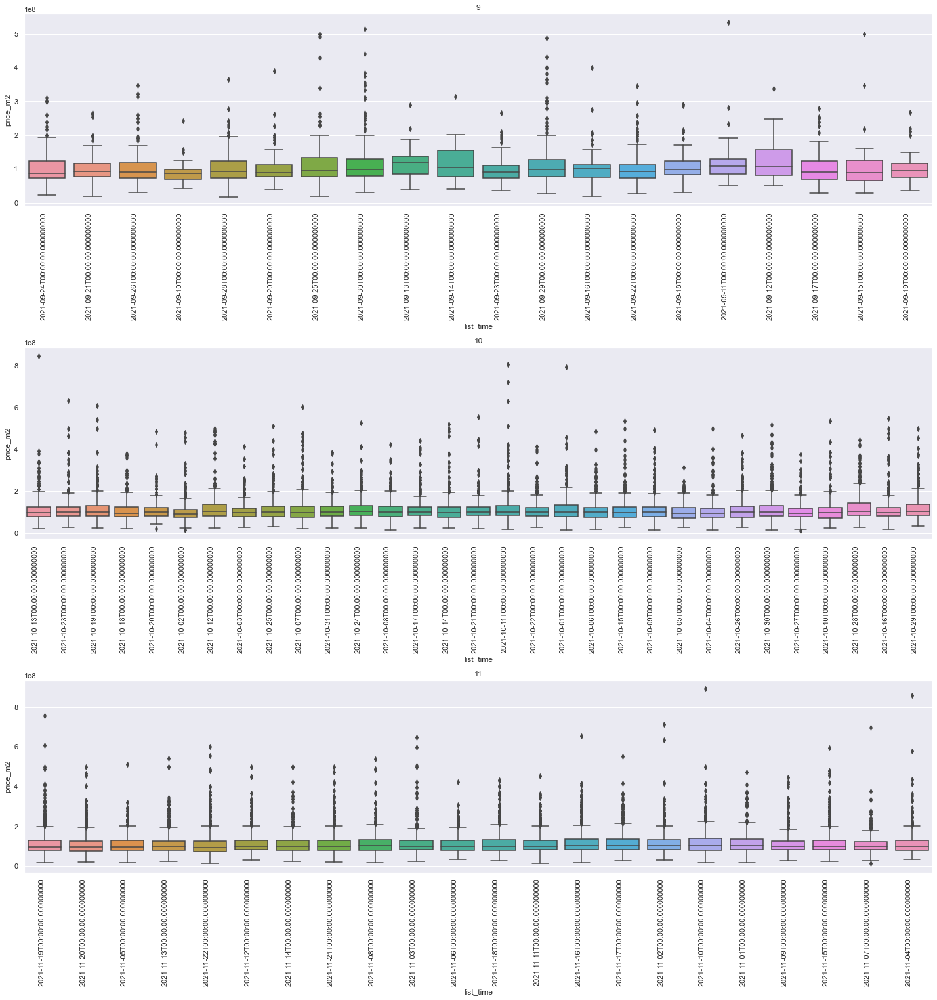

In [37]:
fig = plt.figure(figsize = (20, 350))
sns.set(style = 'darkgrid')
i=1
for m in [9, 10, 11]:
    fig.add_subplot(50, 1, i)
    sns.boxplot(x="list_time", y="price_m2", data=df.query('month == @m'))
    plt.title(m)
    plt.xticks(rotation=90, ha='right')
    i += 1
plt.tight_layout()
plt.show()